Pivoting to a hierarchical structure for a scene graph. This is motivated by the complexity of calculating GED for an arbitrary grpah - structuring it as a tree may yield better performance for similarity metric calculation.

# Setup

## Notebook Setup

Google Colab
- Google Colab secrets: add a Gemini API key as `GOOGLE_API_KEY`. May be pre-populated from a previous session.
    - Need to create an account for Gemini and grab a key there.

In [1]:
# assume run from the root of the repository
import os

try:
    if CONFIGURED_DIRS:
        pass
except:
    PLAYGROUND_DIR = os.getcwd()
    os.chdir("../..")

CONFIGURED_DIRS = True

print(f"Notebook directory: {PLAYGROUND_DIR}")
print(f"Working directory: {os.getcwd()}")

Notebook directory: c:\Users\emily\Documents\coursework\vip lab\kalman-filter-scene-graph\graph_distance\hierarchical_sg
Working directory: c:\Users\emily\Documents\coursework\vip lab\kalman-filter-scene-graph


In [2]:
from PIL import Image
import json
import urllib.request
import cv2
import os
from common.draw_class import Drawer
from common.SceneGraphGenerator import SceneGraphGenerator
from common.video import get_zipnerf, extract_frames

In [3]:
sgg = SceneGraphGenerator()

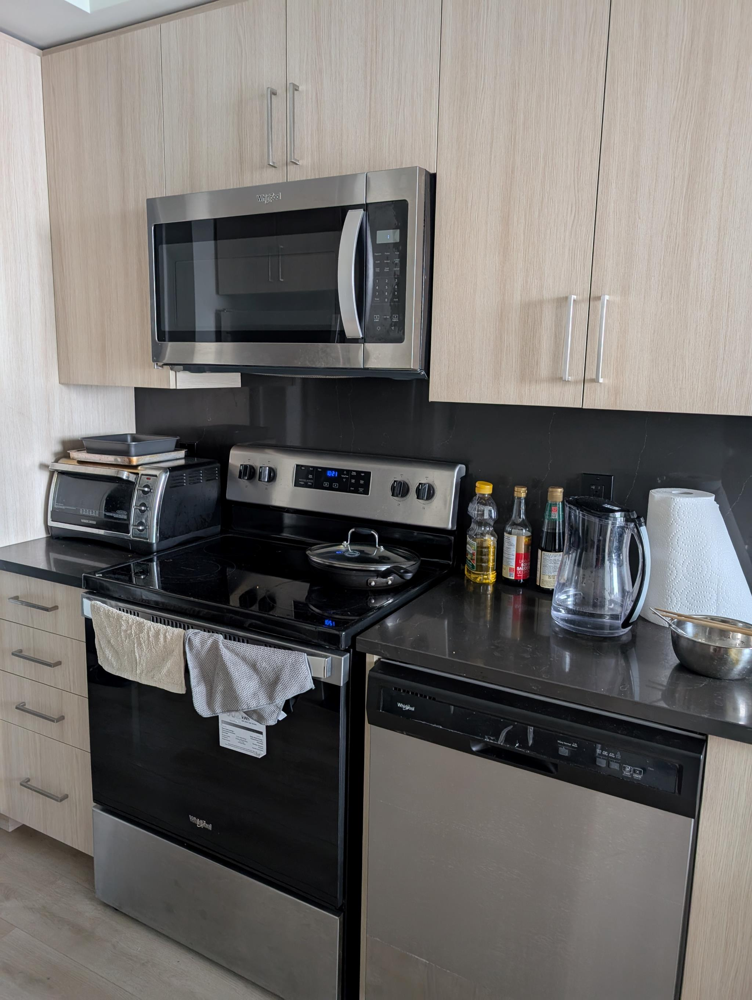

In [4]:
kitchen_portrait = Image.open("img/kitchen_portrait.jpg")
kitchen_portrait

## Util

In [5]:
# helper to print a tree scene graph
def simple_print(node, level=0):
    tabs = '\t' * level
    print(f"{tabs}{node['name']} ({node['id']}) {node['predicate']}: {node['attributes']}")

    for child in node['children']:
        simple_print(child, level+1)

## Grab video frames

In [6]:
zipnerf_video = get_zipnerf()
zipnerf_livingroom_time = [4, 10]
zipnerf_kitchen_time = [10, 12]

Video already available locally at img/zipnerf.mp4.


In [7]:
sample_frames = extract_frames(zipnerf_video, zipnerf_kitchen_time[0], 0.1, 3)
shortvid_frames = extract_frames(zipnerf_video, zipnerf_kitchen_time[0] - 1, 0.05, 60)

Frame rate: 60.0 FPS
Total frames: 1920
Frame rate: 60.0 FPS
Total frames: 1920


# Try generating a hierarchical scene graph

In [8]:
with open("graph_distance/hierarchical_sg/prompt.txt", "r") as f:
    prompt = f.read()

In [9]:
kitchen_portrait_graph = sgg.generate_scene_graph(kitchen_portrait, prompt)
kitchen_portrait_graph

{'id': 1,
 'name': 'kitchen',
 'bbox': [0, 0, 999, 999],
 'attributes': [],
 'predicate': 'root',
 'children': [{'id': 2,
   'name': 'countertop',
   'bbox': [497, 0, 999, 999],
   'attributes': ['dark', 'gray'],
   'predicate': 'in',
   'children': [{'id': 3,
     'name': 'oven',
     'bbox': [560, 116, 944, 466],
     'attributes': ['stainless steel', 'whirlpool'],
     'predicate': 'on',
     'children': []},
    {'id': 4,
     'name': 'dishwasher',
     'bbox': [697, 466, 999, 936],
     'attributes': ['stainless steel', 'whirlpool'],
     'predicate': 'on',
     'children': []},
    {'id': 5,
     'name': 'cooktop',
     'bbox': [450, 277, 562, 613],
     'attributes': ['stainless steel'],
     'predicate': 'on',
     'children': [{'id': 6,
       'name': 'pan',
       'bbox': [531, 376, 582, 536],
       'attributes': ['black'],
       'predicate': 'on',
       'children': []}]},
    {'id': 7,
     'name': 'toaster oven',
     'bbox': [444, 61, 536, 277],
     'attributes': ['bla

In [10]:
simple_print(kitchen_portrait_graph)

kitchen (1) root: []
	countertop (2) in: ['dark', 'gray']
		oven (3) on: ['stainless steel', 'whirlpool']
		dishwasher (4) on: ['stainless steel', 'whirlpool']
		cooktop (5) on: ['stainless steel']
			pan (6) on: ['black']
		toaster oven (7) on: ['black', 'black and decker']
		microwave (8) on: ['stainless steel', 'whirlpool']
		containers (9) on: ['oil', 'vinegar', 'soy sauce']
		pitcher (10) on: ['glass', 'clear']
		paper towels (11) on: ['white']
		bowl (12) on: ['metal', 'silver']
	cabinets (13) in: ['light wood']


In [11]:
# process the tree
objects = {}
relationships = {}

def traverse(node, parent=None):
    if not node:
        return
    
    # add object
    objects[node["id"]] = {
        "name": node["name"],
        "bbox": node["bbox"],
    }

    # add edge to parent
    if parent and node["predicate"] != "root":
        relationships[(node["id"], parent["id"])] = node["predicate"]

    for child in node['children']:
        traverse(child, node)

traverse(kitchen_portrait_graph)

print(objects)
print(relationships)

{1: {'name': 'kitchen', 'bbox': [0, 0, 999, 999]}, 2: {'name': 'countertop', 'bbox': [497, 0, 999, 999]}, 3: {'name': 'oven', 'bbox': [560, 116, 944, 466]}, 4: {'name': 'dishwasher', 'bbox': [697, 466, 999, 936]}, 5: {'name': 'cooktop', 'bbox': [450, 277, 562, 613]}, 6: {'name': 'pan', 'bbox': [531, 376, 582, 536]}, 7: {'name': 'toaster oven', 'bbox': [444, 61, 536, 277]}, 8: {'name': 'microwave', 'bbox': [151, 187, 341, 566]}, 9: {'name': 'containers', 'bbox': [497, 610, 590, 728]}, 10: {'name': 'pitcher', 'bbox': [492, 728, 635, 860]}, 11: {'name': 'paper towels', 'bbox': [454, 851, 562, 973]}, 12: {'name': 'bowl', 'bbox': [577, 860, 681, 999]}, 13: {'name': 'cabinets', 'bbox': [0, 0, 428, 999]}}
{(2, 1): 'in', (3, 2): 'on', (4, 2): 'on', (5, 2): 'on', (6, 5): 'on', (7, 2): 'on', (8, 2): 'on', (9, 2): 'on', (10, 2): 'on', (11, 2): 'on', (12, 2): 'on', (13, 1): 'in'}


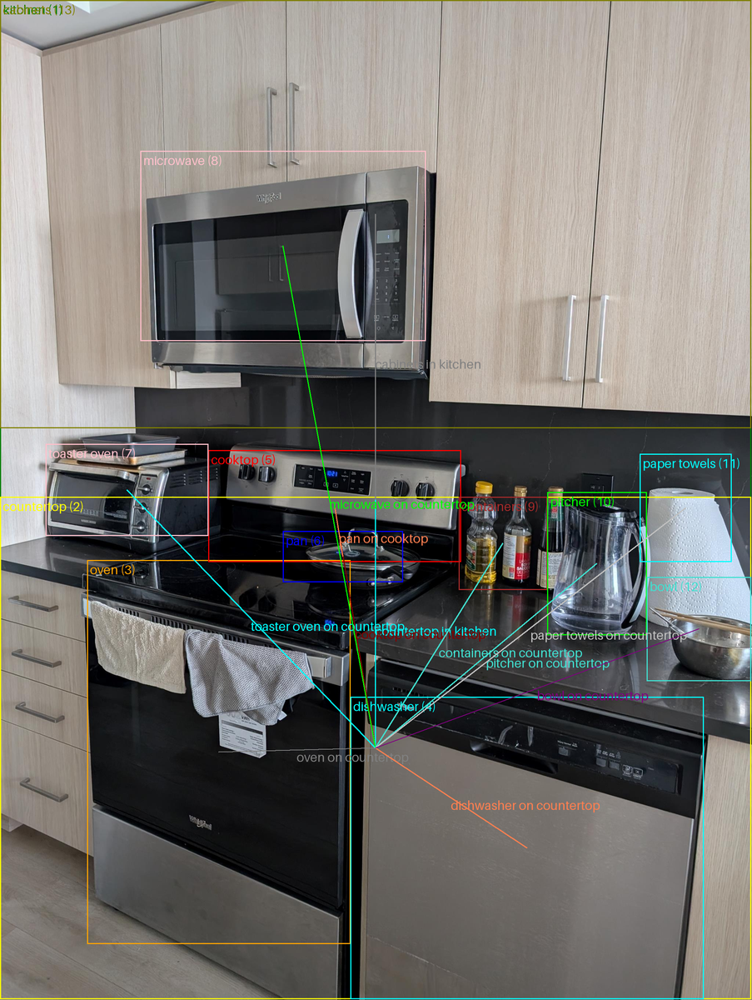

In [12]:
draw = Drawer(kitchen_portrait)

draw.add_objects(objects)
draw.add_relationships(relationships)

draw.draw()
draw.show()

# Tree Edit Distance

In [13]:
from zss import simple_distance, Node
from collections import defaultdict

In [14]:
sample_graphs = []
for frame in sample_frames:
    sample_graph = sgg.generate_scene_graph(frame, prompt)
    sample_graphs.append(sample_graph)
    simple_print(sample_graph)

room (1) root: ['indoor']
	window (2) in: ['white']
		blinds (3) on: ['white']
		backyard (4) in: ['green', 'outdoor']
			plants (5) in: ['green']
			chairs (6) in: ['brown']
	table (7) in: ['brown', 'wooden']
		cups (8) on: ['plastic', 'colorful']
		plate (9) on: ['white']
		bottle (10) on: ['blue', 'plastic']
		chairs (11) on: ['wooden', 'brown']
	counter (12) in: ['beige']
		coffee maker (13) on: ['black']
		shelves (14) on: ['brown', 'wooden']
		picture (15) on: ['framed']
		cup (16) on: ['yellow']
	cart (17) in: ['white']
room (1) root: ['indoor']
	kitchen_counter (2) in: ['brown', 'shiny']
		cutting_board (3) on: ['white']
		coffee_maker (4) on: ['black']
	dining_table (5) in: ['wooden', 'round']
		chair (6) on: ['wooden']
		chair (7) on: ['wooden']
		cup (8) on: ['blue']
		plate (9) on: ['white']
		straw (10) on: ['red']
	window (11) in: ['white']
		blind (12) on: ['white']
		plants (13) in: ['green']
	picture (14) in: ['framed']
	shelf (15) in: ['wooden']
	child_step_stool (16)

In [15]:
# create trees

def make_node(obj):
    info = {
        "id": obj["id"],
        "name": obj["name"],
        "bbox": obj["bbox"],
        "predicate": obj["predicate"],
    }

    label = json.dumps(info)

    node = Node(label)

    for child in obj['children']:
        child_node = make_node(child)
        node.addkid(child_node)
    
    return node

sample_trees = []
for graph in sample_graphs:
    sample_trees.append(make_node(graph))

In [16]:
# define distance

def iou(bb1, bb2):
    x11, y11, x12, y12 = bb1
    x21, y21, x22, y22 = bb2
    x_overlap = max(0, min(x12, x22) - max(x11, x21))
    y_overlap = max(0, min(y12, y22) - max(y11, y21))
    intersection = x_overlap * y_overlap
    union = (x12 - x11) * (y12 - y11) + (x22 - x21) * (y22 - y21) - intersection
    iou = intersection / union
    return iou

def label_dist(a, b):
    a = json.loads(a) if a else defaultdict(lambda: '')
    b = json.loads(b) if b else defaultdict(lambda: '')

    cost = 0

    for k in ['id', 'name', 'predicate']:
        if a[k] != b[k]:
            cost += 1
    
    if not a['bbox'] or not b['bbox']:
        cost += 1
    else:
        iou_score = iou(a['bbox'], b['bbox'])
        if iou_score < 0.5:
            cost += 1
    
    return cost

In [17]:
print(simple_distance(sample_trees[0], sample_trees[1], label_dist=label_dist))
print(simple_distance(sample_trees[1], sample_trees[2], label_dist=label_dist))

58.0
42.0
